In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import cv2
import os

import torch
import torch.nn as nn
from PIL import Image, ImageDraw, ImageFont
import torchvision
import torchvision.transforms as T
import math

In [2]:
class DETRModel(nn.Module):
    def __init__(self,num_classes,num_queries):
        super(DETRModel,self).__init__()
        self.num_classes = num_classes
        self.num_queries = num_queries
        
        self.model = torch.hub.load('facebookresearch/detr', 'detr_resnet50', pretrained=True,force_reload=False)
        #self.model = torch.hub.load('facebookresearch/detr', 'detr_resnet101', pretrained=True)
        #self.model = torch.hub.load('facebookresearch/detr', 'detr_resnet101_dc5', pretrained=True)
        
        self.out = nn.Linear(in_features=self.model.class_embed.out_features,out_features=num_classes+1)
        
    def forward(self,images):
        d = self.model(images)
        d['pred_logits'] = self.out(d['pred_logits'])
        return d
    
    def parameter_groups(self):
        return { 
            'backbone': [p for n,p in self.model.named_parameters()
                              if ('backbone' in n) and p.requires_grad],
            'transformer': [p for n,p in self.model.named_parameters() 
                                 if (('transformer' in n) or ('input_proj' in n)) and p.requires_grad],
            'embed': [p for n,p in self.model.named_parameters()
                                 if (('class_embed' in n) or ('bbox_embed' in n) or ('query_embed' in n)) 
                           and p.requires_grad],
            'final': self.out.parameters()
            }

In [3]:
model = DETRModel(num_classes=1,num_queries=150)

Downloading: "https://github.com/facebookresearch/detr/archive/master.zip" to /root/.cache/torch/hub/master.zip
Downloading: "https://download.pytorch.org/models/resnet50-19c8e357.pth" to /root/.cache/torch/hub/checkpoints/resnet50-19c8e357.pth


Downloading: "https://dl.fbaipublicfiles.com/detr/detr-r50-e632da11.pth" to /root/.cache/torch/hub/checkpoints/detr-r50-e632da11.pth


In [4]:
model.load_state_dict(torch.load("../input/detr-train/detr_best_0.pth"))

<All keys matched successfully>

In [5]:
model.eval()
#model.to('cpu')

DETRModel(
  (model): DETR(
    (transformer): Transformer(
      (encoder): TransformerEncoder(
        (layers): ModuleList(
          (0): TransformerEncoderLayer(
            (self_attn): MultiheadAttention(
              (out_proj): _LinearWithBias(in_features=256, out_features=256, bias=True)
            )
            (linear1): Linear(in_features=256, out_features=2048, bias=True)
            (dropout): Dropout(p=0.1, inplace=False)
            (linear2): Linear(in_features=2048, out_features=256, bias=True)
            (norm1): LayerNorm((256,), eps=1e-05, elementwise_affine=True)
            (norm2): LayerNorm((256,), eps=1e-05, elementwise_affine=True)
            (dropout1): Dropout(p=0.1, inplace=False)
            (dropout2): Dropout(p=0.1, inplace=False)
          )
          (1): TransformerEncoderLayer(
            (self_attn): MultiheadAttention(
              (out_proj): _LinearWithBias(in_features=256, out_features=256, bias=True)
            )
            (linear1):

In [6]:
inf_transform = T.Compose([
    T.ToTensor(),
    T.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

In [7]:
img = Image.open('../input/global-wheat-detection/test/f5a1f0358.jpg').resize((480,360))
imw, imh = img.size
imw, imh

(480, 360)

In [8]:
ratio = imh/imw

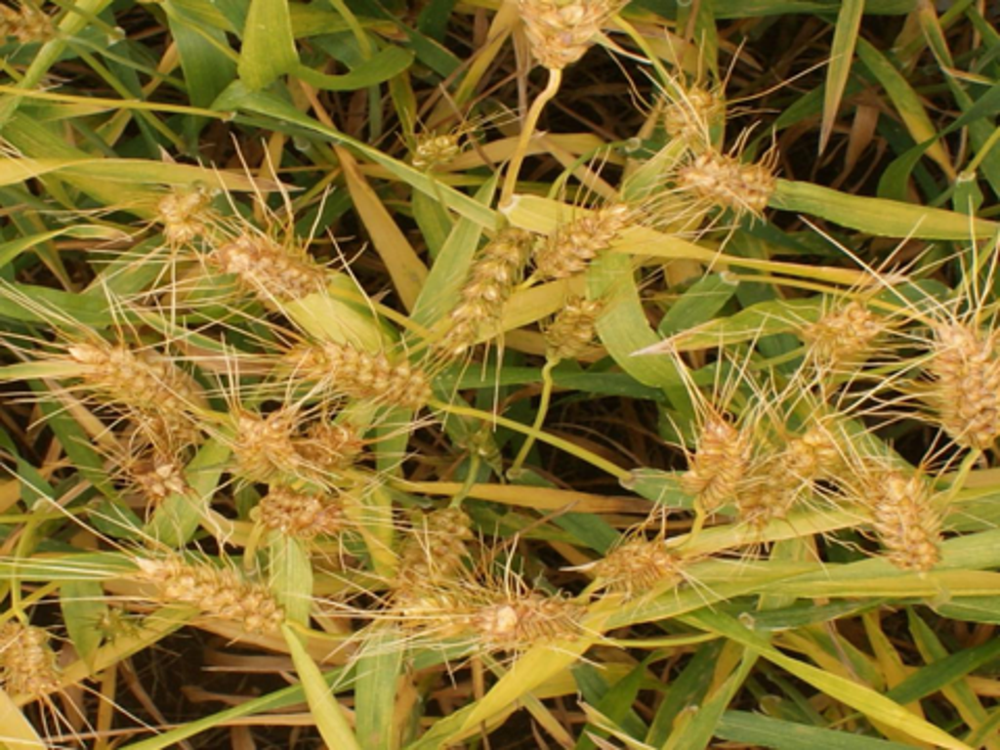

In [9]:
img_inf = img.resize((1024,int(1024 * ratio))).convert('RGB')
img_inf

In [10]:
img_tens = inf_transform(img_inf).unsqueeze(0)

In [11]:
with torch.no_grad():
    outputs = model(img_tens)

In [12]:
im2 = img.copy()
drw = ImageDraw.Draw(im2)

oboxes = outputs['pred_boxes'][0] * torch.Tensor([imw, imh, imw, imh])
prob   = outputs['pred_logits'][0].softmax(1).detach().cpu().numpy()
classes = np.argmax(prob, axis=1)
prob   = np.max(prob, axis=1)

#print(classes)
#print(prob)


for box,p,c in zip(oboxes,prob,classes):

    if (p > 0.5) & (c!=1):
        box = box.cpu()
        print(p, box)        
        x, y, w, h = box
        x0, x1 = x-w//2, x+w//2
        y0, y1 = y-h//2, y+h//2
        drw.rectangle([x0, y0, x1, y1], outline='red', width=2)
        drw.text((x0+4, y0+4), '%.1f'%(p*100), fill='white')

0.74713236 tensor([107.6337, 288.3538,  35.3076,  19.7673])
0.88218695 tensor([205.6730,  70.5600,  19.1649,  11.2264])
0.54281384 tensor([375.4112, 226.4685,  21.1670,  21.0658])
0.8075077 tensor([ 86.0302, 100.8816,  17.3053,  15.1402])
0.8436373 tensor([340.1210, 221.6424,  18.4997,  28.9214])
0.6640195 tensor([206.6367, 260.8315,  19.4660,  21.0627])
0.9049225 tensor([460.8352, 184.9364,  21.1663,  40.4901])
0.8504371 tensor([401.6393, 163.4605,  23.2989,  22.3146])
0.64894384 tensor([312.4988,  78.6583,  19.3779,  21.0940])
0.8070016 tensor([136.9232, 245.5012,  21.3728,  14.8390])
0.7188144 tensor([328.6474,  54.9496,  20.0936,  18.9214])
0.7467332 tensor([128.8847, 126.6213,  31.7412,  19.1269])
0.8284552 tensor([123.2009, 211.0048,  21.4183,  20.6713])
0.5351066 tensor([229.6276, 129.6793,  25.1640,  25.1246])
0.642882 tensor([13.7077,  9.6385, 13.8195, 10.1745])
0.5141508 tensor([ 61.5942, 186.6471,  42.8181,  32.8708])
0.514828 tensor([252.7969, 297.0579,  26.2860,  14.9692])

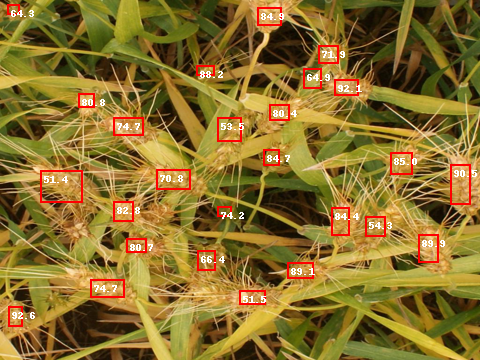

In [13]:
im2

In [14]:
test_files = os.listdir('../input/global-wheat-detection/test/')

In [15]:
test_files

['796707dd7.jpg',
 '2fd875eaa.jpg',
 'cc3532ff6.jpg',
 '53f253011.jpg',
 'f5a1f0358.jpg',
 '51f1be19e.jpg',
 'aac893a91.jpg',
 'cb8d261a3.jpg',
 '51b3e36ab.jpg',
 '348a992bb.jpg']

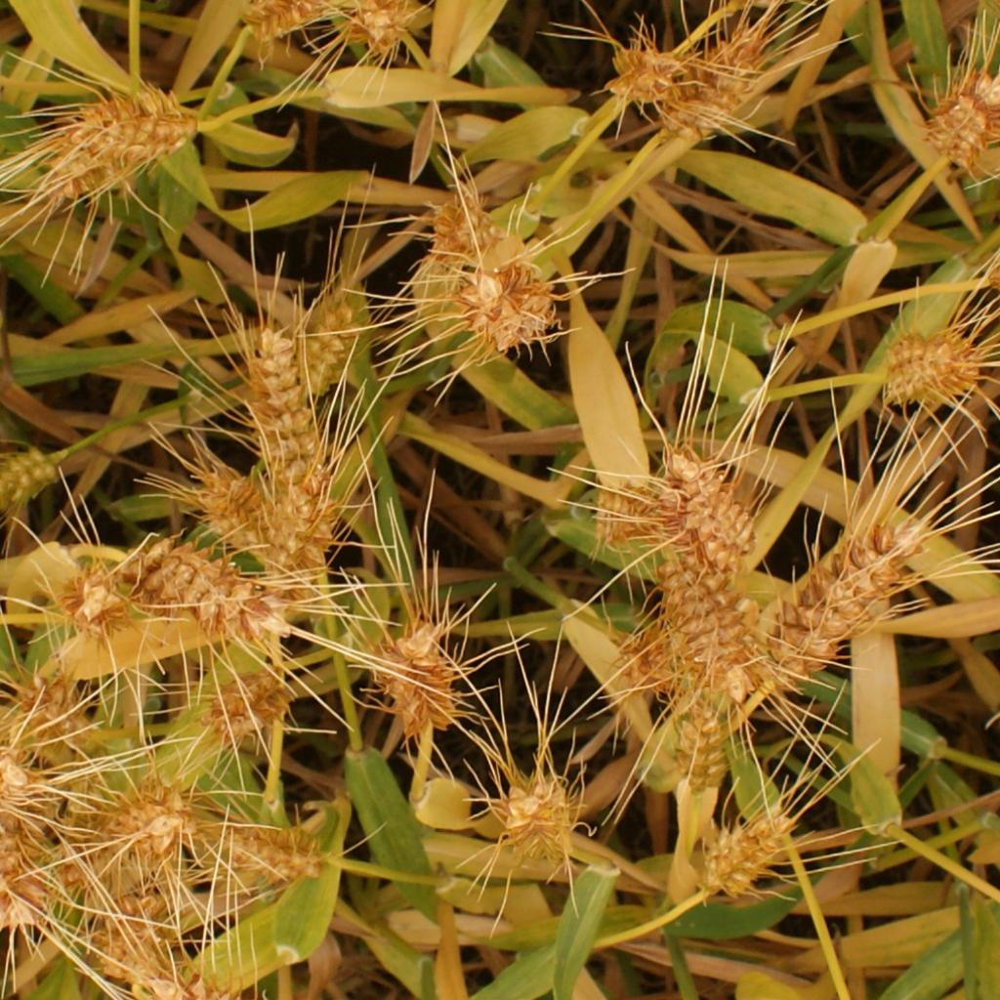

In [16]:
for file in test_files:
    img = Image.open('../input/global-wheat-detection/test/'+file)
    break
img

In [17]:
def format_prediction_string(boxes, scores):
    pred_strings = []
    for j in zip(scores, boxes):
        pred_strings.append("{0:.4f} {1} {2} {3} {4}".format(j[0], j[1][0], j[1][1], j[1][2], j[1][3]))
    return " ".join(pred_strings)

796707dd7.jpg 7 7
2fd875eaa.jpg 21 21
cc3532ff6.jpg 20 20
53f253011.jpg 21 21
f5a1f0358.jpg 21 21
51f1be19e.jpg 17 17
aac893a91.jpg 16 16
cb8d261a3.jpg 14 14
51b3e36ab.jpg 24 24
348a992bb.jpg 23 23


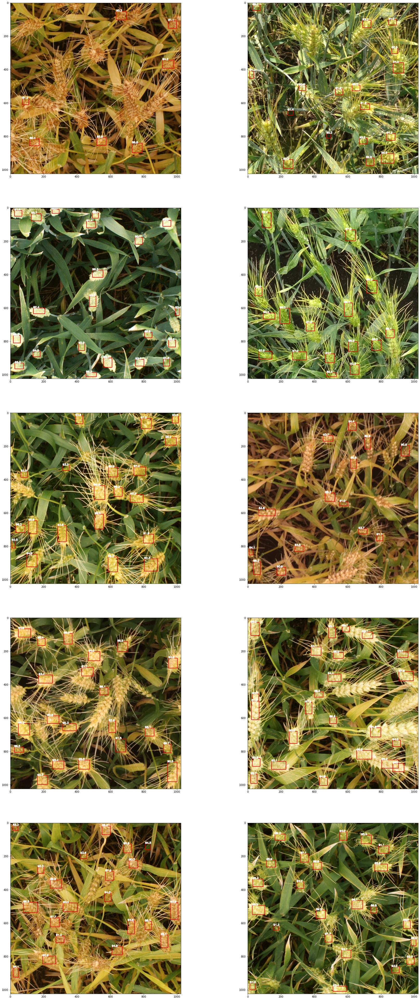

In [18]:
results =[]
fig, ax = plt.subplots(5, 2, figsize=(30, 70))
count = 0

for file in test_files:
    img = Image.open('../input/global-wheat-detection/test/'+file)
    im_w, im_h = img.size
    ratio = im_h / im_w
    img = img.resize((608,int(608*ratio)))
    img = img.resize((800,int(800*ratio))).convert('RGB')
    img_tens = inf_transform(img).unsqueeze(0)
    with torch.no_grad():
        outputs = model(img_tens)
        
    try:
        oboxes = outputs['pred_boxes'][0]
        prob   = outputs['pred_logits'][0].softmax(1).detach().cpu().numpy()
        classes = torch.from_numpy(np.argmax(prob, axis=1))
        probs   = torch.from_numpy(np.max(prob, axis=1)).squeeze(0).squeeze(0)

        pred_strings = []

        mask_classes = classes !=1
        idx_classes = torch.nonzero(mask_classes)

        oboxes=oboxes[idx_classes].permute(1,0,2).squeeze(0)
        probs=probs[idx_classes].permute(1,0).squeeze(0)

        mask_probs = probs > 0.8
        idx_probs = torch.nonzero(mask_probs)

        oboxes=oboxes[idx_probs].permute(1,0,2).squeeze(0)#.detach().cpu().numpy()
        probs=probs[idx_probs].permute(1,0).squeeze(0).detach().cpu().numpy()

        oboxes=oboxes * torch.Tensor([im_w, im_h, im_w, im_h])
        oboxes=oboxes.detach().cpu().numpy()#.astype(np.int32)
        
        num_boxes = oboxes.shape[0]
        
        transf = np.concatenate((oboxes[:, [2, 3]]/2, np.zeros((num_boxes, 2))), axis=1)     

        #print(oboxes)
        
        oboxes = (oboxes[:, [0, 1, 2, 3]] - transf).astype(np.int32)#.clip(min=0, max=1024)
        
        oboxes = np.clip(oboxes, a_min = 0, a_max = [im_w, im_h, im_w, im_h]) 
        
        #oboxes = oboxes.astype(np.int32)
        #print(oboxes)
        
        #transf = oboxes[:, [2, 3]]//2
        

        print(file, len(oboxes), len(probs))

    except Exception as e:
        oboxes=np.array([])
        probs=np.array([])
        #print('erro')
        #print(str(e))
        
       
    image_id = file.split(".")[0]
    
    result = {'image_id': image_id,'PredictionString': format_prediction_string(oboxes, probs)}
    results.append(result)    
      
    #if file == '2fd875eaa.jpg':
    if count < 10:
        img_ = cv2.imread('../input/global-wheat-detection/test/'+file)
        img_ = cv2.cvtColor(img_, cv2.COLOR_BGR2RGB)
        #print('ok')
        #img = Image.open('../input/global-wheat-detection/test/'+file)
        #im2 = img.copy()
        #drw = ImageDraw.Draw(im2)
        
        for box,p in zip(oboxes,probs):
            
            x, y, w, h = box
            #x0, x1 = x-w//2, x+w//2
            #y0, y1 = y-h//2, y+h//2
            
            x0, x1 = x, x+w
            y0, y1 = y, y+h
            
            #print(x0, y0, x1, y1)
            
            #drw.rectangle([x0, y0, x1, y1], outline='red', width=2)
            #drw.text((x0+4, y0+4), '%.1f'%(p*100), fill='white')
            cv2.rectangle(img_, (x0, y0), (x1, y1), (220, 0, 0), 2)
            cv2.putText(img_, '%.1f'%(p*100), (x0, y0), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255,255,255), 2, cv2.LINE_AA)
            ax[count%5][count//5].imshow(img_)
        count+=1

In [19]:
test_df = pd.DataFrame(results, columns=['image_id', 'PredictionString'])

In [20]:
test_df.sort_values(by='image_id', inplace=True)
test_df

,image_id,PredictionString
1,2fd875eaa,0.8802 491 32 36 31 0.8527 453 987 62 25 0.933...
9,348a992bb,0.8920 163 68 60 37 0.9317 862 862 47 36 0.898...
8,51b3e36ab,0.9514 143 859 86 48 0.8666 566 51 44 33 0.896...
5,51f1be19e,0.9192 526 516 43 35 0.9592 801 903 75 58 0.86...
3,53f253011,0.9149 631 725 60 78 0.9457 47 66 74 49 0.9511...
0,796707dd7,0.8939 115 815 57 41 0.8684 729 841 61 57 0.94...
6,aac893a91,0.9294 66 860 78 46 0.8655 473 988 58 24 0.829...
7,cb8d261a3,0.9094 174 926 53 47 0.9438 604 58 47 48 0.937...
2,cc3532ff6,0.9487 96 847 63 76 0.9379 389 19 45 48 0.9642...
4,f5a1f0358,0.9089 193 798 78 47 0.8799 549 20 50 51 0.935...


In [21]:
!rm -rf ./*

In [22]:
test_df.to_csv('submission.csv', index=False)
test_df.head(10)

,image_id,PredictionString
1,2fd875eaa,0.8802 491 32 36 31 0.8527 453 987 62 25 0.933...
9,348a992bb,0.8920 163 68 60 37 0.9317 862 862 47 36 0.898...
8,51b3e36ab,0.9514 143 859 86 48 0.8666 566 51 44 33 0.896...
5,51f1be19e,0.9192 526 516 43 35 0.9592 801 903 75 58 0.86...
3,53f253011,0.9149 631 725 60 78 0.9457 47 66 74 49 0.9511...
0,796707dd7,0.8939 115 815 57 41 0.8684 729 841 61 57 0.94...
6,aac893a91,0.9294 66 860 78 46 0.8655 473 988 58 24 0.829...
7,cb8d261a3,0.9094 174 926 53 47 0.9438 604 58 47 48 0.937...
2,cc3532ff6,0.9487 96 847 63 76 0.9379 389 19 45 48 0.9642...
4,f5a1f0358,0.9089 193 798 78 47 0.8799 549 20 50 51 0.935...
